# COSC 2779 Deep learning: Assignment 1


## Data Exploration & Analysis

### Data Retrieval

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive/


In [ ]:
%cd /content/gdrive/My Drive/A1_data/

# Check current OS directory
!ls

/content/gdrive/My Drive/A1_data
'Deep Learning A1 Submission'   s1234567_predictions.csv
 images			        s3806077_predictions.csv
 modified_data.zip	        test_data.csv
 README.md		        train_data.csv
 s1234567.csv


In [ ]:
# Import Essential dependencies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sklearn
import tensorflow as tf

In [ ]:
# Read train and test dataset.
train_df = pd.read_csv("train_data.csv")
test_df = pd.read_csv("test_data.csv")

In [ ]:
# Check Data Structure (Train).
print(train_df.head(20))

         filename  person_id  series  tilt  pan
0    face_790.jpg          5       1   -15   30
1   face_2445.jpg          5       1     0  -75
2   face_2266.jpg          5       2   -15  -60
3   face_2713.jpg          5       2     0  -90
4   face_2016.jpg          5       2    15  -75
5   face_2522.jpg          5       1    30   60
6   face_1254.jpg          5       2    15  -15
7   face_2754.jpg          5       1    15  -45
8    face_201.jpg          5       2    30  -90
9    face_931.jpg          5       1    15  -30
10   face_260.jpg          5       1   -15   90
11   face_136.jpg          5       2   -60   15
12  face_2194.jpg          5       2   -30   15
13  face_1921.jpg          5       1    15   90
14   face_203.jpg          5       1    30  -15
15  face_1795.jpg          5       2    15   45
16   face_511.jpg          5       2   -60  -75
17  face_1906.jpg          5       1     0   15
18  face_1348.jpg          5       2    90    0
19  face_1324.jpg          5       1   -

In [ ]:
# Check Data Structure (Test).
print(test_df.head(20))

         filename  person_id  series
0     face_33.jpg          2       1
1   face_2148.jpg          2       2
2   face_2119.jpg          2       1
3   face_1262.jpg          2       1
4    face_516.jpg          2       2
5   face_1530.jpg          2       2
6    face_464.jpg          2       2
7   face_1971.jpg          2       1
8     face_92.jpg          2       1
9    face_921.jpg          2       2
10  face_2767.jpg          2       2
11   face_563.jpg          2       2
12  face_1471.jpg          2       1
13  face_1513.jpg          2       1
14  face_1585.jpg          2       1
15  face_1113.jpg          2       1
16  face_2556.jpg          2       2
17  face_2226.jpg          2       1
18   face_819.jpg          2       2
19  face_1824.jpg          2       2


### Display/Observe Images in train dataset

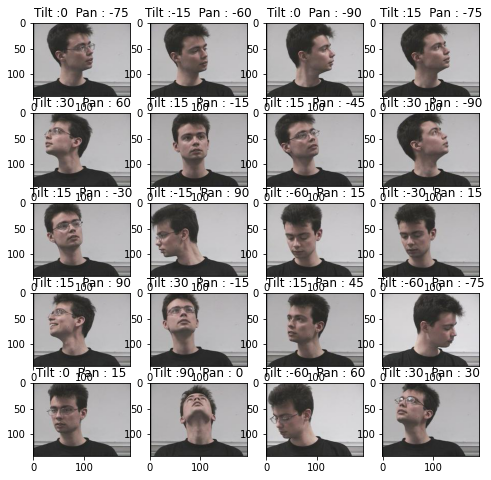

In [ ]:
# Display 20 images to observe the type of images that are present in the train dataset.
w=10
h=10
fig=plt.figure(figsize=(8, 8))
columns = 4
rows = 5
for i in range(1, columns*rows +1):
    img = mpimg.imread('images/modified_data/train/'+train_df.iloc[i,:]['filename'])
    fig.add_subplot(rows, columns, i)
    plt.title("Tilt :" + str(train_df.iloc[i,:]['tilt']) + "  Pan : " + str(train_df.iloc[i,:]['pan']) )
    plt.imshow(img)
plt.show()

### Display/Observe Images in test dataset

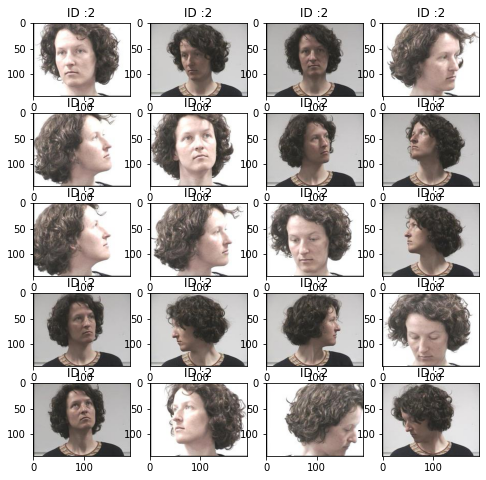

In [ ]:
# Display 20 images to observe the type of images that are present in the test dataset.
w=10
h=10
fig=plt.figure(figsize=(8, 8))
columns = 4
rows = 5
for i in range(1, columns*rows +1):
    img = mpimg.imread('images/modified_data/'+test_df.iloc[i,:]['filename'])
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.title("ID :" + str(test_df.iloc[i,:]['person_id']) )
    
plt.show()

### Convert Images into pixels and store in Pandas Dataframe

In [ ]:
# Import dependencies for image processing
from numpy import asarray
from PIL import Image
import cv2

In [ ]:
# Check image dimension
width, height = Image.open("images/modified_data/train/face_790.jpg").size

print("Width:", width)
print("Height", height)

Width: 192
Height 144


In [ ]:
# Create pandas dataframe to be used for input for our models
train_data = pd.DataFrame()

In [ ]:
# Store images in dataframe (For training models):
for index, row in train_df.iterrows():

  # Load image
  # image = Image.open('images/modified_data/train/'+row['filename'])
  pixels = cv2.imread('images/modified_data/train/'+row['filename'])

  # Convert from integers to floats
  pixels = pixels.astype('float32')

  # Normalize to the range 0-1
  pixels /= 255.0
 
  data = pd.DataFrame()

  print("Appending.. ", index)
  
  # Append pixels value with its respective pan and tilt angles
  train_data = train_data.append({ "image": pixels, "tilt": row["tilt"], "pan": row["pan"]}, ignore_index= True)

Appending..  0
Appending..  1
Appending..  2
Appending..  3
Appending..  4
Appending..  5
Appending..  6
Appending..  7
Appending..  8
Appending..  9
Appending..  10
Appending..  11
Appending..  12
Appending..  13
Appending..  14
Appending..  15
Appending..  16
Appending..  17
Appending..  18
Appending..  19
Appending..  20
Appending..  21
Appending..  22
Appending..  23
Appending..  24
Appending..  25
Appending..  26
Appending..  27
Appending..  28
Appending..  29
Appending..  30
Appending..  31
Appending..  32
Appending..  33
Appending..  34
Appending..  35
Appending..  36
Appending..  37
Appending..  38
Appending..  39
Appending..  40
Appending..  41
Appending..  42
Appending..  43
Appending..  44
Appending..  45
Appending..  46
Appending..  47
Appending..  48
Appending..  49
Appending..  50
Appending..  51
Appending..  52
Appending..  53
Appending..  54
Appending..  55
Appending..  56
Appending..  57
Appending..  58
Appending..  59
Appending..  60
Appending..  61
Appending..  62
Ap

In [ ]:
# Re-index train data dataframe:
order = ["image", "tilt", "pan"]

train_data = train_data.reindex(columns=order)

# Check storage of train data:
print(train_data.head(20))

                                                image  tilt   pan
0   [[[0.09019608, 0.08627451, 0.09411765], [0.043... -15.0  30.0
1   [[[0.09803922, 0.09019608, 0.09019608], [0.043...   0.0 -75.0
2   [[[0.09019608, 0.09019608, 0.09019608], [0.039... -15.0 -60.0
3   [[[0.08627451, 0.08235294, 0.09019608], [0.039...   0.0 -90.0
4   [[[0.09803922, 0.09411765, 0.101960786], [0.04...  15.0 -75.0
5   [[[0.09411765, 0.09411765, 0.09411765], [0.035...  30.0  60.0
6   [[[0.08235294, 0.078431375, 0.08627451], [0.05...  15.0 -15.0
7   [[[0.09803922, 0.09803922, 0.09803922], [0.039...  15.0 -45.0
8   [[[0.08235294, 0.08235294, 0.08235294], [0.058...  30.0 -90.0
9   [[[0.08235294, 0.08235294, 0.08235294], [0.058...  15.0 -30.0
10  [[[0.09411765, 0.08235294, 0.09019608], [0.050... -15.0  90.0
11  [[[0.08235294, 0.08235294, 0.08235294], [0.043... -60.0  15.0
12  [[[0.078431375, 0.078431375, 0.078431375], [0.... -30.0  15.0
13  [[[0.09019608, 0.09019608, 0.09019608], [0.035...  15.0  90.0
14  [[[0.0

In [ ]:
# Create pandas dataframe to be used for testing our models
test_data = pd.DataFrame()

In [ ]:
# Store images in dataframe (For test models):
for index, row in test_df.iterrows():

  # Load image
  # image = Image.open('images/modified_data/'+row['filename'])
  pixels = cv2.imread('images/modified_data/'+row['filename'])
  # pixels = asarray(image)

  # Convert from integers to floats
  pixels = pixels.astype('float32')

  # Normalize to the range 0-1
  pixels /= 255.0
 
  data = pd.DataFrame()

  print("Appending.. ", index)
  
  # Append pixels value with its respective pan and tilt angles
  test_data = test_data.append({ "image": pixels}, ignore_index= True)

Appending..  0
Appending..  1
Appending..  2
Appending..  3
Appending..  4
Appending..  5
Appending..  6
Appending..  7
Appending..  8
Appending..  9
Appending..  10
Appending..  11
Appending..  12
Appending..  13
Appending..  14
Appending..  15
Appending..  16
Appending..  17
Appending..  18
Appending..  19
Appending..  20
Appending..  21
Appending..  22
Appending..  23
Appending..  24
Appending..  25
Appending..  26
Appending..  27
Appending..  28
Appending..  29
Appending..  30
Appending..  31
Appending..  32
Appending..  33
Appending..  34
Appending..  35
Appending..  36
Appending..  37
Appending..  38
Appending..  39
Appending..  40
Appending..  41
Appending..  42
Appending..  43
Appending..  44
Appending..  45
Appending..  46
Appending..  47
Appending..  48
Appending..  49
Appending..  50
Appending..  51
Appending..  52
Appending..  53
Appending..  54
Appending..  55
Appending..  56
Appending..  57
Appending..  58
Appending..  59
Appending..  60
Appending..  61
Appending..  62
Ap

In [ ]:
# Check storage of test data:
print(test_data.head(20))

                                                image
0   [[[0.09411765, 0.09411765, 0.09411765], [0.039...
1   [[[0.09411765, 0.09411765, 0.09411765], [0.043...
2   [[[0.08627451, 0.08627451, 0.08627451], [0.050...
3   [[[0.08235294, 0.09019608, 0.09411765], [0.047...
4   [[[0.08235294, 0.08235294, 0.08235294], [0.031...
5   [[[0.08627451, 0.08627451, 0.08627451], [0.039...
6   [[[0.09411765, 0.09411765, 0.09411765], [0.043...
7   [[[0.08235294, 0.09019608, 0.09411765], [0.043...
8   [[[0.078431375, 0.08627451, 0.09019608], [0.04...
9   [[[0.08627451, 0.08627451, 0.08627451], [0.027...
10  [[[0.08627451, 0.08627451, 0.08627451], [0.039...
11  [[[0.09019608, 0.09019608, 0.09019608], [0.027...
12  [[[0.08235294, 0.08235294, 0.08235294], [0.047...
13  [[[0.06666667, 0.07450981, 0.078431375], [0.05...
14  [[[0.078431375, 0.08627451, 0.08627451], [0.04...
15  [[[0.08235294, 0.078431375, 0.08627451], [0.04...
16  [[[0.08627451, 0.08627451, 0.08627451], [0.039...
17  [[[0.0627451, 0.07058824

### Check that pixel values are normalized within range [0 - 1]

In [ ]:
import cv2

# load image
image = Image.open('images/modified_data/train/face_790.jpg')
pixels = asarray(image)

# confirm pixel range is 0-255
print('Data Type: %s' % pixels.dtype)
print('Min: %.3f, Max: %.3f' % (pixels.min(), pixels.max()))

# convert from integers to floats
pixels = pixels.astype('float32')

print(pixels.shape)
# normalize to the range 0-1
pixels /= 255.0
# confirm the normalization
print('Min: %.3f, Max: %.3f' % (pixels.min(), pixels.max()))


Data Type: uint8
Min: 0.000, Max: 234.000
(144, 192, 3)
Min: 0.000, Max: 0.918


## Performance Evaluation/Visualization with TensorBoard (Instrumentation)


### Tensorboard

In [ ]:
# Import Denpendencies for tensorboard
import tensorflow_datasets as tfds
import pathlib
import shutil
import tempfile


from  IPython import display

In [ ]:
logdir = pathlib.Path(tempfile.mkdtemp())/"tensorboard_logs"
shutil.rmtree(logdir, ignore_errors=True)


%load_ext tensorboard

%tensorboard --logdir {logdir}/models

<IPython.core.display.Javascript object>

In [ ]:
def get_callbacks_base(name):
  return [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20,verbose=1,restore_best_weights=True),
    tf.keras.callbacks.TensorBoard(logdir/name),
  ]

### Visualization Functions

In [ ]:
from itertools import cycle

# Plotter function to compare learning curves.
def plotter(history_hold, metric = 'loss', ylim=[0.0, 1.0]):
  cycol = cycle('bgrcmk')
  for name, item in history_hold.items():
    y_train = item.history[metric]
    y_val = item.history['val_' + metric]
    x_train = np.arange(0,len(y_val))

    c=next(cycol)

    plt.plot(x_train, y_train, c+'-', label=name+'_train')
    plt.plot(x_train, y_val, c+'--', label=name+'_val')

  plt.legend()
  plt.xlim([1, max(plt.xlim())])
  plt.ylim(ylim)
  plt.xlabel('Epoch')
  plt.ylabel(metric)
  plt.grid(True)

In [ ]:

# Plotter function to visualize last train/val loss in grid search.
def plotter_search( data, param_list, keyword, metric = 'loss', label='lambda'):
  plt.figure(figsize=(10,5))

  # Mean squared error:
  metric = metric
  l_train = list()
  l_val = list()

  for val in param_list:
    l_train.append(data[keyword + str(val)].history[metric][-1])
    l_val.append(data[keyword + str(val)].history['val_' + metric][-1])

  plt.plot(param_list,l_train, 'ro', label='Train' )
  plt.plot(param_list,l_val, 'bs', label='Test' )

  plt.xlabel(label, fontsize=14)
  plt.ylabel('Mean Squared Error', fontsize=14)
  plt.legend()
  plt.show()

## Model: Base/Simple CNN Model

In [ ]:
base_models_histories = {}

### Training a simple model with a single output (Tilt or Pan)

In [ ]:
# cnn with single convolutional, pooling and output layer
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense


def base_model_single_output():
  # create model
  model = Sequential()
  # add convolutional layer
  model.add(Conv2D(32, (3,3), input_shape=(144, 192, 3)))
  model.add(MaxPooling2D())
  model.add(Flatten())
  model.add(Dense(1))


  return model


print(base_model_single_output().summary())




Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 142, 190, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 71, 95, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 215840)            0         
_________________________________________________________________
dense (Dense)                (None, 1)                 215841    
Total params: 216,737
Trainable params: 216,737
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
from keras import losses 
from keras import optimizers 
from keras import metrics 

# Initalize a singe output based model to predict tilt values
single_output_model = base_model_single_output()
single_output_model.compile(loss = 'mean_squared_error',  optimizer = 'adam', metrics = [tf.keras.metrics.MeanSquaredError()])

In [ ]:
# Split Training dataframe with 
trainX = np.asarray(train_data.loc[:,"image"].values.tolist())
trainY = np.asarray(train_data.loc[:,"tilt"].values.tolist())

In [ ]:
# Check training data shapes.
print(trainX.shape)
print(trainY.shape)

(2325, 144, 192, 3)
(2325,)


In [ ]:
# fit model
history = single_output_model.fit(trainX, trainY, epochs=50, batch_size=16, verbose=1, callbacks=get_callbacks_base("models/single_output_base_model_1"), validation_split=0.25)

Epoch 1/50
  1/109 [..............................] - ETA: 0s - loss: 2126.2610 - mean_squared_error: 2126.2610WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
109/109 [==============================] - 1s 8ms/step - loss: 1156.2117 - mean_squared_error: 1156.2117 - val_loss: 1108.8790 - val_mean_squared_error: 1108.8790
Epoch 2/50
109/109 [==============================] - 1s 6ms/step - loss: 646.5242 - mean_squared_error: 646.5242 - val_loss: 580.3954 - val_mean_squared_error: 580.3954
Epoch 3/50
109/109 [==============================] - 1s 6ms/step - loss: 492.5013 - mean_squared_error: 492.5013 - val_loss: 541.7220 - val_mean_squared_error: 541.7220
Epoch 4/50
109/109 [==============================] - 1s 7ms/step - loss: 419.0639 - mean_squared_error: 419

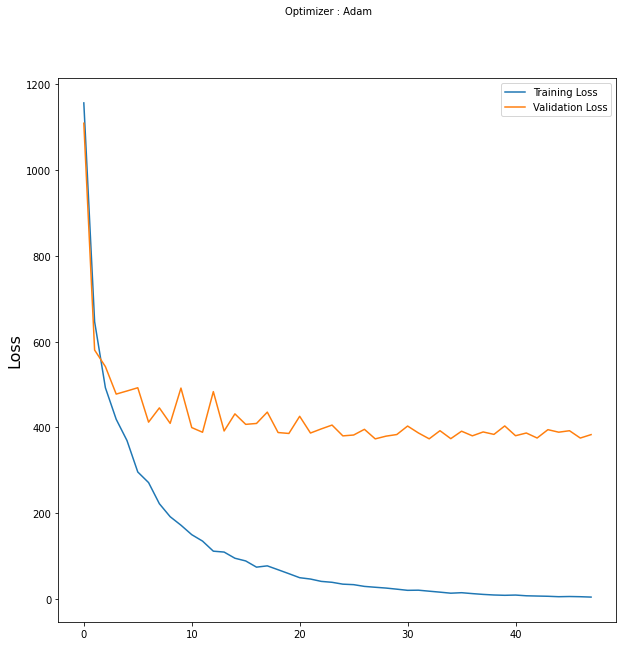

In [ ]:
# plot the evolution of Loss on the train and validation sets
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
plt.suptitle('Optimizer : Adam', fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.show()

As we can observe from the learning curve above, the simply model (with a single output) is overfitting, and therefore needs to increase in depth to perform better.

In [ ]:
from keras import losses 
from keras import optimizers 
from keras import metrics 

# Initalize a singe output based model to predict pan values
single_output_model_pan = base_model_single_output()
single_output_model_pan.compile(loss = 'mean_squared_error',  optimizer = 'adam')

In [ ]:
# Split Training dataframe with 
trainX = np.asarray(train_data.loc[:,"image"].values.tolist())
trainY = np.asarray(train_data.loc[:,"pan"].values.tolist())

In [ ]:
# Check training data shapes.
print(trainX.shape)
print(trainY.shape)

(2325, 144, 192, 3)
(2325,)


In [ ]:
# fit model
history = single_output_model_pan.fit(trainX, trainY, epochs=50, batch_size=16, verbose=1, callbacks=get_callbacks_base("models/single_output_base_model_2"), validation_split=0.25)

Epoch 1/50
109/109 [==============================] - 1s 7ms/step - loss: 2791.7136 - val_loss: 2330.4280
Epoch 2/50
109/109 [==============================] - 1s 6ms/step - loss: 1949.6205 - val_loss: 1647.4017
Epoch 3/50
109/109 [==============================] - 1s 6ms/step - loss: 1460.8921 - val_loss: 1407.2273
Epoch 4/50
109/109 [==============================] - 1s 6ms/step - loss: 1212.2690 - val_loss: 1641.4982
Epoch 5/50
109/109 [==============================] - 1s 6ms/step - loss: 1094.0439 - val_loss: 916.8013
Epoch 6/50
109/109 [==============================] - 1s 6ms/step - loss: 930.0600 - val_loss: 1038.0166
Epoch 7/50
109/109 [==============================] - 1s 6ms/step - loss: 893.9074 - val_loss: 1052.0771
Epoch 8/50
109/109 [==============================] - 1s 6ms/step - loss: 680.8906 - val_loss: 821.0781
Epoch 9/50
109/109 [==============================] - 1s 6ms/step - loss: 651.4250 - val_loss: 895.3593
Epoch 10/50
109/109 [==============================] 

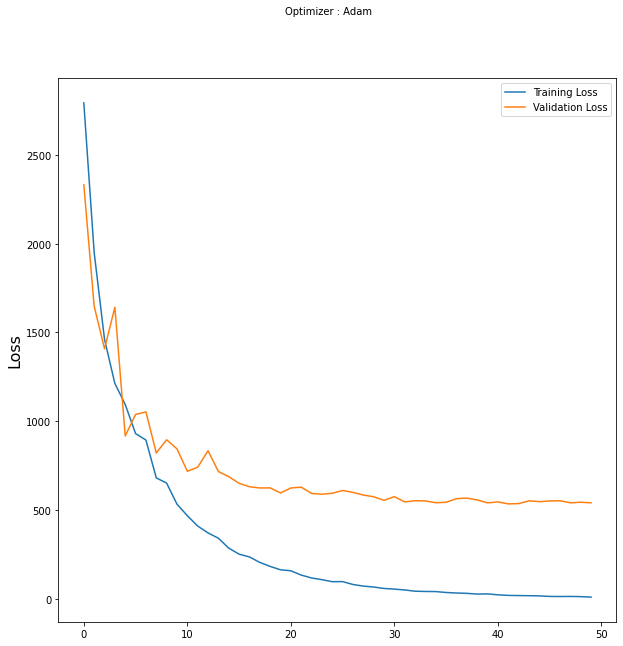

In [ ]:
# plot the evolution of Loss on the train and validation sets
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
plt.suptitle('Optimizer : Adam', fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.show()

### Training a simple model with two outputs (Tilt and Pan)

In [ ]:

def base_model_double_output():
  # create model
  model = Sequential()
  # add convolutional layer
  model.add(Conv2D(32, (3,3), input_shape=(144, 192, 3)))
  model.add(MaxPooling2D())
  model.add(Flatten())
  model.add(Dense(2))


  return model

In [ ]:
# Split Training dataframe with 
trainX = np.asarray(train_data.loc[:,"image"].values.tolist())
trainY = np.asarray(train_data.iloc[:,1:3].values.tolist())

In [ ]:
# Check training data shapes: There should be 2 target outputs.
print("Train X Shape:", trainX.shape)
print("Train Y Shape:", trainY.shape)

# Check train Y output
print(trainY)

Train X Shape: (2325, 144, 192, 3)
Train Y Shape: (2325, 2)
[[-15.  30.]
 [  0. -75.]
 [-15. -60.]
 ...
 [ 15. -30.]
 [-60.  15.]
 [ 30. -90.]]


In [ ]:
# Initalize a double output based model to predict both pan/tilt values
double_output_base_model = base_model_double_output()
double_output_base_model.compile(loss = 'mean_squared_error',  optimizer = 'adam', metrics = [tf.keras.metrics.MeanSquaredError()])

In [ ]:
# fit model
history = double_output_base_model.fit(trainX, trainY, epochs=50, batch_size=16, verbose=1, callbacks=get_callbacks_base("models/double_output_base_model"), validation_split=0.25)

Epoch 1/50
109/109 [==============================] - 1s 8ms/step - loss: 1961.8212 - mean_squared_error: 1961.8212 - val_loss: 1403.6744 - val_mean_squared_error: 1403.6744
Epoch 2/50
109/109 [==============================] - 1s 7ms/step - loss: 1188.3679 - mean_squared_error: 1188.3679 - val_loss: 980.3599 - val_mean_squared_error: 980.3599
Epoch 3/50
109/109 [==============================] - 1s 7ms/step - loss: 908.2098 - mean_squared_error: 908.2098 - val_loss: 774.0065 - val_mean_squared_error: 774.0065
Epoch 4/50
109/109 [==============================] - 1s 7ms/step - loss: 809.2999 - mean_squared_error: 809.2999 - val_loss: 768.3337 - val_mean_squared_error: 768.3337
Epoch 5/50
109/109 [==============================] - 1s 7ms/step - loss: 624.5516 - mean_squared_error: 624.5516 - val_loss: 693.2782 - val_mean_squared_error: 693.2782
Epoch 6/50
109/109 [==============================] - 1s 7ms/step - loss: 545.2390 - mean_squared_error: 545.2390 - val_loss: 690.9374 - val_mea

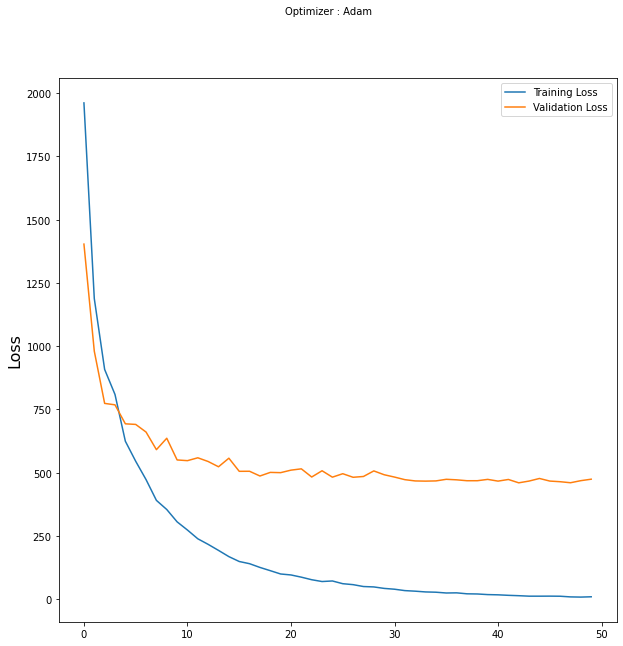

In [ ]:
# plot the evolution of Loss on the train and validation sets
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
plt.suptitle('Optimizer : Adam', fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.show()

We can see from the learning curve above than the validation loss does not improve at around the 10th epoch and is therefore overfitting. Our current model can still be furthur improved. We will be experimenting with deeper models in the sections below in an attempt to improve the performance of our final model.

### Observe values predicted by double output model

In [ ]:
double_output_base_model.evaluate(trainX, trainY)

73/73 [==============================] - 0s 6ms/step - loss: 123.7753 - mean_squared_error: 123.7753


[123.77532196044922, 123.77532196044922]

In [ ]:
# Initalize Test Data
predX = np.asarray(test_data.loc[:,"image"].values.tolist())

In [ ]:
# Check Test Data shape
predX.shape

(465, 144, 192, 3)

In [ ]:
# Perform Prediction with the simple model
predY = double_output_base_model.predict(predX)

In [ ]:
# Check that there are two values for prediction made by model (Tilt/Pan)
predY

array([[ 9.96754990e+01, -1.96133099e+01],
       [ 8.43458023e+01,  3.49892921e+01],
       [-1.49520378e+01,  1.38142681e+01],
       [ 6.87857056e+00,  3.13604808e+00],
       [ 7.49066696e+01, -1.37686249e+02],
       [ 3.89333801e+01, -1.02453529e+02],
       [ 1.05950340e+02, -3.77081299e+01],
       [ 3.43742790e+01, -8.50212326e+01],
       [ 2.15445118e+01,  5.06395187e+01],
       [ 3.81749802e+01, -9.31049728e+01],
       [ 5.14098625e+01, -7.83464737e+01],
       [ 5.26806870e+01,  4.17970848e+01],
       [-7.70636463e+00,  6.69571152e+01],
       [ 3.20708275e+01, -5.51654816e+01],
       [-5.64437943e+01,  1.43607025e+01],
       [-1.31023798e+01, -1.04567764e+02],
       [ 1.96709766e+01,  2.60153599e+01],
       [ 4.91487885e+01, -6.43507614e+01],
       [ 7.38833847e+01,  3.12165966e+01],
       [-3.88394094e+00, -8.89060516e+01],
       [-4.98739700e+01,  5.88570862e+01],
       [ 1.30001251e+02, -1.99503498e+01],
       [ 4.35570030e+01, -1.74119301e+01],
       [ 4.

##Model: Deeper CNN Model

In [ ]:
deeper_models_histories = {}

In [ ]:
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Dropout, Activation
from tensorflow.keras import regularizers, optimizers


def model_block(model, no_neurons=32, activation="relu", batch_norm=False, max_pool=False, reg_lambda = 0.0, reg=False):

  # Check if reg bool.
  print("Reg: ", reg)

  # If reg is added, initialized kernel regularizer.
  if reg is True:
    model.add(Conv2D(no_neurons, (3,3), padding='same', kernel_regularizer=regularizers.l2(reg_lambda), activation = activation))
  else:
    model.add(Conv2D(no_neurons, (3,3), padding='same', activation = activation))

  # If batch_norm is true, add Batch Normalization.
  if batch_norm:
    model.add(BatchNormalization())

  # If max_pool is true, add Max Pooling 2D layer (Halving).
  if max_pool:
    model.add(MaxPooling2D())

  # Return model with added layers.
  return model

### Deeper Model with more Convolution layers and hidden FC layers

---



In [ ]:
def deeper_model_double_output():
  # create model
  model = Sequential()


  # add convolutional layer #1
  model.add(Conv2D(32, (3,3), input_shape=(144, 192, 3), padding='same'))
  #model.add(MaxPooling2D())

  # Conv Layer #2
  model = model_block(model, 32, max_pool=True)

  # Conv Layer #3
  model = model_block(model, 64, max_pool=False)

  # Conv Layer #4
  model = model_block(model, 64, max_pool=True)

  # Conv Layer #5
  model = model_block(model, 128, max_pool=False)

  # Conv Layer #6
  model = model_block(model, 128, max_pool=True)

  # Flatten for FC layers
  model.add(Flatten())

  # Fully Connected Layers.
  model.add(Dense(256, activation='relu'))
  
  # Multiple outputs to predict both Pan/Tilt values.
  model.add(Dense(2))


  model.compile(loss = 'mean_squared_error',  optimizer = 'adam')

  return model

print(deeper_model_double_output().summary())

Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 144, 192, 32)      896       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 144, 192, 32)      9248      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 72, 96, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 72, 96, 64)        18496     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 72, 96, 64)        36928     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 36, 48, 64)        0         
____________________________________________________________

In [ ]:
# Split Training dataframe with 
trainX = np.asarray(train_data.loc[:,"image"].values.tolist())
trainY = np.asarray(train_data.iloc[:,1:3].values.tolist())

In [ ]:
# Check training data shapes: There should be 2 target outputs.
print("Train X Shape:", trainX.shape)
print("Train Y Shape:", trainY.shape)

Train X Shape: (2325, 144, 192, 3)
Train Y Shape: (2325, 2)


In [ ]:
# Initilize deeper model
deeper_model_double_output = deeper_model_double_output()

Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False


In [ ]:
# fit model
deeper_models_histories["deeper_model_double_output"] = deeper_model_double_output.fit(trainX, trainY, epochs=50, batch_size=16, verbose=1, callbacks=get_callbacks_base("models/double_output_base_model"), validation_split=0.25)

Epoch 1/50
109/109 [==============================] - 2s 19ms/step - loss: 2286.7859 - val_loss: 2300.4954
Epoch 2/50
109/109 [==============================] - 2s 15ms/step - loss: 1795.6953 - val_loss: 763.8346
Epoch 3/50
109/109 [==============================] - 2s 15ms/step - loss: 441.0625 - val_loss: 550.8905
Epoch 4/50
109/109 [==============================] - 2s 15ms/step - loss: 272.5144 - val_loss: 502.5162
Epoch 5/50
109/109 [==============================] - 2s 15ms/step - loss: 190.7865 - val_loss: 387.8376
Epoch 6/50
109/109 [==============================] - 2s 15ms/step - loss: 150.3562 - val_loss: 542.6144
Epoch 7/50
109/109 [==============================] - 2s 15ms/step - loss: 121.8920 - val_loss: 505.0202
Epoch 8/50
109/109 [==============================] - 2s 15ms/step - loss: 103.6150 - val_loss: 480.2831
Epoch 9/50
109/109 [==============================] - 2s 15ms/step - loss: 81.3638 - val_loss: 491.3919
Epoch 10/50
109/109 [==============================] 

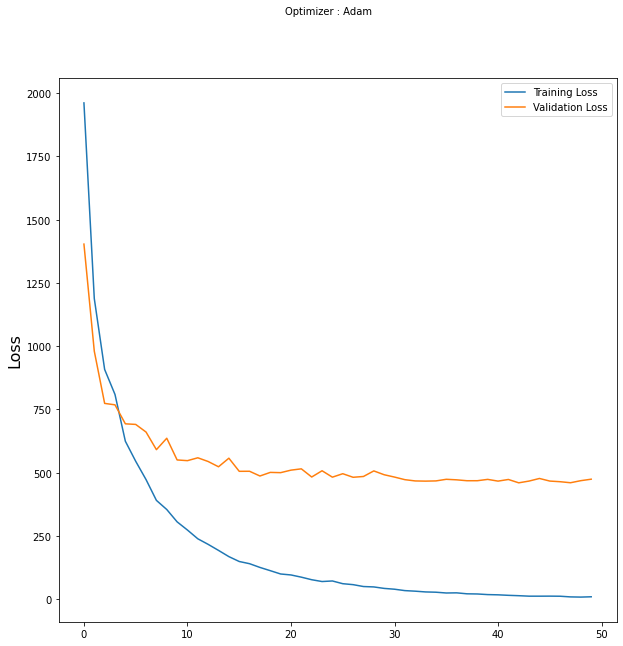

In [ ]:
# plot the evolution of Loss on the train and validation sets
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
plt.suptitle('Optimizer : Adam', fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.show()

### Deeper Model with Batch Normalization

In [ ]:
# Import Adamn optimizer to set lr
from keras.optimizers import Adam

def deeper_model_with_bn(learning_rate = 0.001):
  # create model
  model = Sequential()


  # add convolutional layer #1
  model.add(Conv2D(32, (3,3), input_shape=(144, 192, 3), padding='same'))
  model.add(BatchNormalization())
  #model.add(MaxPooling2D())

  # Conv Layer #2
  model = model_block(model, 32, max_pool=True, batch_norm=True )

  # Conv Layer #3
  model = model_block(model, 64, max_pool=False, batch_norm=True )

  # Conv Layer #4
  model = model_block(model, 64, max_pool=True, batch_norm=True)

  # Conv Layer #4
  model = model_block(model, 128, max_pool=False, batch_norm=True )

  # Conv Layer #5
  model = model_block(model, 128, max_pool=True, batch_norm=True )

  # Flatten for FC layers
  model.add(Flatten())

  # Fully Connected Layers.
  model.add(Dense(256, activation='relu'))
  model.add(BatchNormalization())

  
  # Multiple outputs to predict both Tilt/Pan values.
  model.add(Dense(2))


  opt = Adam(lr=learning_rate)
  model.compile(loss = 'mean_squared_error',  optimizer = opt)

  return model
print(deeper_model_with_bn().summary())

Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 144, 192, 32)      896       
_________________________________________________________________
batch_normalization (BatchNo (None, 144, 192, 32)      128       
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 144, 192, 32)      9248      
_________________________________________________________________
batch_normalization_1 (Batch (None, 144, 192, 32)      128       
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 72, 96, 32)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 72, 96, 64)        18496     
____________________________________________________________

In [ ]:
# Initilize deeper model with batch normalization
deeper_model_with_bn = deeper_model_with_bn()

Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False


In [ ]:
# fit model
deeper_models_histories["deeper_model_with_bn"]  = deeper_model_with_bn.fit(trainX, trainY, epochs=50, batch_size=16, verbose=1, callbacks=get_callbacks_base("models/deeper_model_with_bn"), validation_split=0.25)

Epoch 1/50
109/109 [==============================] - 2s 21ms/step - loss: 1005.9664 - val_loss: 2287.9778
Epoch 2/50
109/109 [==============================] - 2s 18ms/step - loss: 357.6867 - val_loss: 2771.5295
Epoch 3/50
109/109 [==============================] - 2s 18ms/step - loss: 289.1051 - val_loss: 4056.7512
Epoch 4/50
109/109 [==============================] - 2s 19ms/step - loss: 240.6165 - val_loss: 1404.5713
Epoch 5/50
109/109 [==============================] - 2s 19ms/step - loss: 236.4100 - val_loss: 881.4867
Epoch 6/50
109/109 [==============================] - 2s 19ms/step - loss: 232.7371 - val_loss: 434.5262
Epoch 7/50
109/109 [==============================] - 2s 18ms/step - loss: 190.1845 - val_loss: 486.1043
Epoch 8/50
109/109 [==============================] - 2s 19ms/step - loss: 173.6453 - val_loss: 512.5310
Epoch 9/50
109/109 [==============================] - 2s 18ms/step - loss: 194.4086 - val_loss: 446.3222
Epoch 10/50
109/109 [=============================

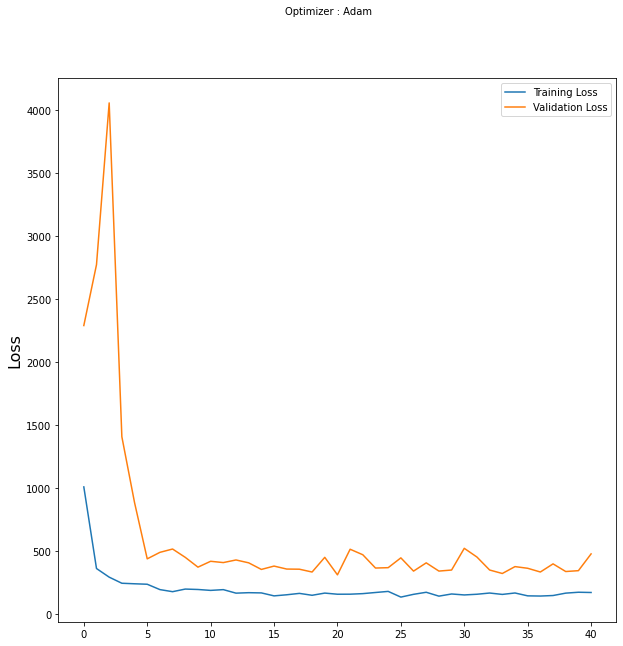

In [ ]:
# plot the evolution of Loss on the train and validation sets
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
plt.suptitle('Optimizer : Adam', fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(deeper_models_histories["deeper_model_with_bn"].history['loss'], label='Training Loss')
plt.plot(deeper_models_histories["deeper_model_with_bn"].history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.show()

As we can observe from the learning curve above, the model with Batch Normalization of each layer produces a high flunctuation in the validation loss. As this is an undesireable outcome, we will try to decrease the learning rate as well as tune the regularization hyperparameters in the model below.

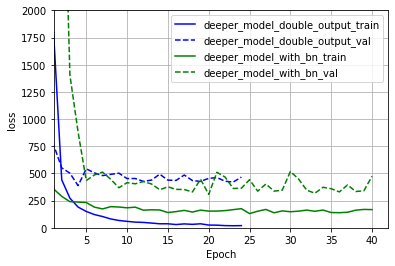

In [ ]:
plotter(deeper_models_histories, ylim=[0, 2000], metric='loss')

### Deeper Model with regularization parameters (Dropout, Kernel regularizer)

In [ ]:
def deeper_model_with_reg(learning_rate = 0.0001, reg_bool = False, reg_lambda = 0.0, dropout=0.0):
  # create model
  model = Sequential()


  # add convolutional layer #1
  model.add(Conv2D(32, (3,3), input_shape=(144, 192, 3), padding='same', kernel_regularizer=regularizers.l2(reg_lambda)))
  model.add(BatchNormalization())
  #model.add(MaxPooling2D())

  # Conv Layer #2
  model = model_block(model, 32, max_pool=True, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda )

  # Conv Layer #3
  model = model_block(model, 64, max_pool=False, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda )

  # Conv Layer #4
  model = model_block(model, 64, max_pool=True, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda)

  # Flatten for FC layers
  model.add(Flatten())
  model.add(Dropout(dropout))


  # Fully Connected Layers.
  model.add(Dense(512, activation='relu', kernel_regularizer=regularizers.l2(reg_lambda)))
  model.add(BatchNormalization())
  model.add(Dropout(dropout))
 

  
  # Multiple outputs to predict both Tilt/Pan values.
  model.add(Dense(2))


  opt = Adam(lr=learning_rate)
  model.compile(loss = 'mean_squared_error',  optimizer = opt)

  return model
print(deeper_model_with_reg().summary())

Reg:  False
Reg:  False
Reg:  False
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_28 (Conv2D)           (None, 144, 192, 32)      896       
_________________________________________________________________
batch_normalization_14 (Batc (None, 144, 192, 32)      128       
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 144, 192, 32)      9248      
_________________________________________________________________
batch_normalization_15 (Batc (None, 144, 192, 32)      128       
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 72, 96, 32)        0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 72, 96, 64)        18496     
_________________________________________________________________
batch_normalizatio

In [ ]:
# Initilize deeper model with regularization
model_with_reg = deeper_model_with_reg()

Reg:  False
Reg:  False
Reg:  False


In [ ]:
# fit model
deeper_models_histories["deeper_model_with_reg"]  = model_with_reg.fit(trainX, trainY, epochs=50, batch_size=16, verbose=1, callbacks=get_callbacks_base("models/deeper_model_with_reg"), validation_split=0.25)

Epoch 1/50
109/109 [==============================] - 3s 24ms/step - loss: 1271.8361 - val_loss: 2290.8896
Epoch 2/50
109/109 [==============================] - 2s 21ms/step - loss: 877.7549 - val_loss: 2291.5608
Epoch 3/50
109/109 [==============================] - 2s 22ms/step - loss: 722.0125 - val_loss: 2016.8348
Epoch 4/50
109/109 [==============================] - 2s 22ms/step - loss: 570.6427 - val_loss: 1555.9325
Epoch 5/50
109/109 [==============================] - 2s 22ms/step - loss: 483.6125 - val_loss: 1116.9543
Epoch 6/50
109/109 [==============================] - 2s 22ms/step - loss: 399.8379 - val_loss: 664.7711
Epoch 7/50
109/109 [==============================] - 2s 22ms/step - loss: 330.2161 - val_loss: 560.2088
Epoch 8/50
109/109 [==============================] - 2s 22ms/step - loss: 286.9059 - val_loss: 492.5135
Epoch 9/50
109/109 [==============================] - 2s 22ms/step - loss: 244.5296 - val_loss: 438.6910
Epoch 10/50
109/109 [============================

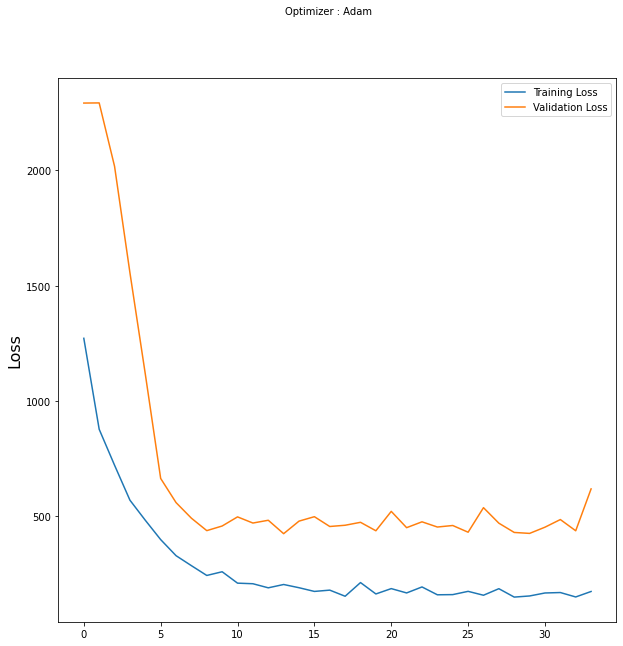

In [ ]:
# plot the evolution of Loss on the train and validation sets
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
plt.suptitle('Optimizer : Adam', fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(deeper_models_histories["deeper_model_with_reg"].history['loss'], label='Training Loss')
plt.plot(deeper_models_histories["deeper_model_with_reg"].history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.show()

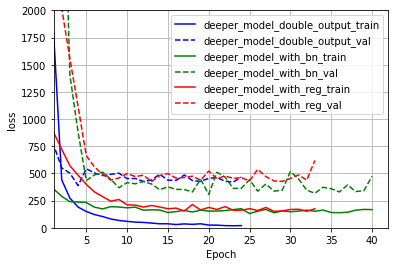

In [ ]:
plotter(deeper_models_histories, ylim=[0, 2000], metric='loss')

### Deeper Model with 2 Fully Connect Layers 

In [ ]:
def deeper_model_with_two_fc(learning_rate = 0.0001, reg_bool = False, reg_lambda = 0.0, dropout=0.0):
  # create model
  model = Sequential()


  # add convolutional layer #1
  model.add(Conv2D(32, (3,3), input_shape=(144, 192, 3), padding='same', kernel_regularizer=regularizers.l2(reg_lambda)))
  model.add(BatchNormalization())
  #model.add(MaxPooling2D())

  # Conv Layer #2
  model = model_block(model, 32, max_pool=True, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda )

  # Conv Layer #3
  model = model_block(model, 64, max_pool=False, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda )

  # Conv Layer #4
  model = model_block(model, 64, max_pool=True, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda)


  # Flatten for FC layers
  model.add(Flatten())
  model.add(Dropout(dropout))


  # Fully Connected Layers.
  model.add(Dense(512, activation='relu', kernel_regularizer=regularizers.l2(reg_lambda)))
  model.add(BatchNormalization())
  model.add(Dropout(dropout))

  model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(reg_lambda)))
  model.add(BatchNormalization())
  model.add(Dropout(dropout))
  
  # Multiple outputs to predict both Tilt/Pan values.
  model.add(Dense(2))


  opt = Adam(lr=learning_rate)
  model.compile(loss = 'mean_squared_error',  optimizer = opt)

  return model
print(deeper_model_with_reg().summary())

Reg:  False
Reg:  False
Reg:  False
Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_36 (Conv2D)           (None, 144, 192, 32)      896       
_________________________________________________________________
batch_normalization_24 (Batc (None, 144, 192, 32)      128       
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 144, 192, 32)      9248      
_________________________________________________________________
batch_normalization_25 (Batc (None, 144, 192, 32)      128       
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 72, 96, 32)        0         
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 72, 96, 64)        18496     
_________________________________________________________________
batch_normalizati

In [ ]:
# Initilize deeper model with two fully connected layers
deeper_model_with_two_fc = deeper_model_with_two_fc()

Reg:  False
Reg:  False
Reg:  False


In [ ]:
# fit model
deeper_models_histories["deeper_model_with_two_fc"]  = deeper_model_with_two_fc.fit(trainX, trainY, epochs=50, batch_size=16, verbose=1, callbacks=get_callbacks_base("models/deeper_model_with_two_fc"), validation_split=0.25)

Epoch 1/50
109/109 [==============================] - 3s 25ms/step - loss: 1550.8915 - val_loss: 2267.2883
Epoch 2/50
109/109 [==============================] - 2s 22ms/step - loss: 1182.6321 - val_loss: 2184.8674
Epoch 3/50
109/109 [==============================] - 2s 22ms/step - loss: 1041.0667 - val_loss: 1952.4785
Epoch 4/50
109/109 [==============================] - 2s 22ms/step - loss: 913.9594 - val_loss: 1555.0780
Epoch 5/50
109/109 [==============================] - 2s 23ms/step - loss: 812.9739 - val_loss: 1132.1194
Epoch 6/50
109/109 [==============================] - 2s 23ms/step - loss: 711.8363 - val_loss: 901.0413
Epoch 7/50
109/109 [==============================] - 2s 23ms/step - loss: 623.7109 - val_loss: 712.0064
Epoch 8/50
109/109 [==============================] - 2s 22ms/step - loss: 555.3104 - val_loss: 621.4147
Epoch 9/50
109/109 [==============================] - 2s 22ms/step - loss: 483.7874 - val_loss: 579.9444
Epoch 10/50
109/109 [==========================

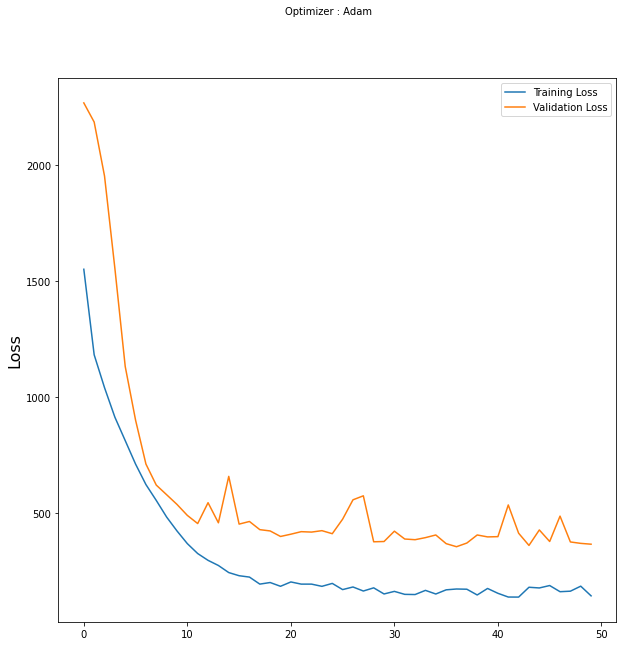

In [ ]:
# plot the evolution of Loss on the train and validation sets
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
plt.suptitle('Optimizer : Adam', fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(deeper_models_histories["deeper_model_with_two_fc"].history['loss'], label='Training Loss')
plt.plot(deeper_models_histories["deeper_model_with_two_fc"].history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.show()

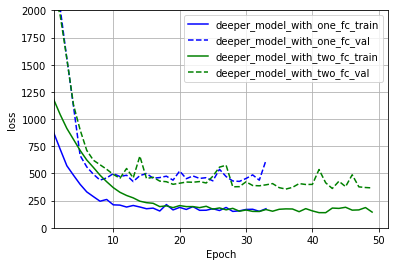

In [ ]:
compare_fc_models_histories = {}

compare_fc_models_histories['deeper_model_with_one_fc'] = deeper_models_histories['deeper_model_with_reg']
compare_fc_models_histories['deeper_model_with_two_fc'] = deeper_models_histories['deeper_model_with_two_fc']



plotter(compare_fc_models_histories, ylim=[0,2000], metric='loss')

### Deeper Model: Different Receptive Field Comparison

In [ ]:
def deeper_model_with_larger_rf(learning_rate = 0.0001, reg_bool = False, reg_lambda = 0.0, dropout=0.0):
  # create model
  model = Sequential()


  # add convolutional layer #1
  model.add(Conv2D(32, (3,3), input_shape=(144, 192, 3), padding='same', kernel_regularizer=regularizers.l2(reg_lambda)))
  model.add(BatchNormalization())
  #model.add(MaxPooling2D())

  # Conv Layer #2
  model = model_block(model, 32, max_pool=True, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda )

  # Conv Layer #3
  model = model_block(model, 64, max_pool=False, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda )

  # Conv Layer #4
  model = model_block(model, 64, max_pool=True, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda)

  # Conv Layer #4
  model = model_block(model, 128, max_pool=False, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda )

  # Conv Layer #5
  model = model_block(model, 128, max_pool=True, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda )

  # Flatten for FC layers
  model.add(Flatten())
  model.add(Dropout(dropout))


  # Fully Connected Layers.
  model.add(Dense(512, activation='relu', kernel_regularizer=regularizers.l2(reg_lambda)))
  model.add(BatchNormalization())
  model.add(Dropout(dropout))

  model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(reg_lambda)))
  model.add(BatchNormalization())
  model.add(Dropout(dropout))

  
  # Multiple outputs to predict both Tilt/Pan values.
  model.add(Dense(2))


  opt = Adam(lr=learning_rate)
  model.compile(loss = 'mean_squared_error',  optimizer = opt)

  return model
print(deeper_model_with_reg().summary())

Reg:  False
Reg:  False
Reg:  False
Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_44 (Conv2D)           (None, 144, 192, 32)      896       
_________________________________________________________________
batch_normalization_35 (Batc (None, 144, 192, 32)      128       
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 144, 192, 32)      9248      
_________________________________________________________________
batch_normalization_36 (Batc (None, 144, 192, 32)      128       
_________________________________________________________________
max_pooling2d_24 (MaxPooling (None, 72, 96, 32)        0         
_________________________________________________________________
conv2d_46 (Conv2D)           (None, 72, 96, 64)        18496     
_________________________________________________________________
batch_normalizati

In [ ]:
# Initilize deeper model with a smaller receptive field
model_larger_rf = deeper_model_with_larger_rf()

Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False


In [ ]:
# fit model
deeper_models_histories["deeper_model_with_larger_rf"]  = model_larger_rf.fit(trainX, trainY, epochs=50, batch_size=16, verbose=1, callbacks=get_callbacks_base("models/deeper_model_with_larger_rf"), validation_split=0.25)

Epoch 1/50
109/109 [==============================] - 3s 25ms/step - loss: 1504.1620 - val_loss: 2277.2712
Epoch 2/50
109/109 [==============================] - 2s 21ms/step - loss: 1152.8586 - val_loss: 2143.6396
Epoch 3/50
109/109 [==============================] - 2s 21ms/step - loss: 1005.0656 - val_loss: 1942.8920
Epoch 4/50
109/109 [==============================] - 2s 21ms/step - loss: 896.2935 - val_loss: 1547.7759
Epoch 5/50
109/109 [==============================] - 2s 21ms/step - loss: 781.6078 - val_loss: 1241.0209
Epoch 6/50
109/109 [==============================] - 2s 21ms/step - loss: 679.9492 - val_loss: 873.4471
Epoch 7/50
109/109 [==============================] - 2s 21ms/step - loss: 603.5270 - val_loss: 737.9502
Epoch 8/50
109/109 [==============================] - 2s 21ms/step - loss: 538.3225 - val_loss: 618.6136
Epoch 9/50
109/109 [==============================] - 2s 21ms/step - loss: 466.3623 - val_loss: 552.4601
Epoch 10/50
109/109 [==========================

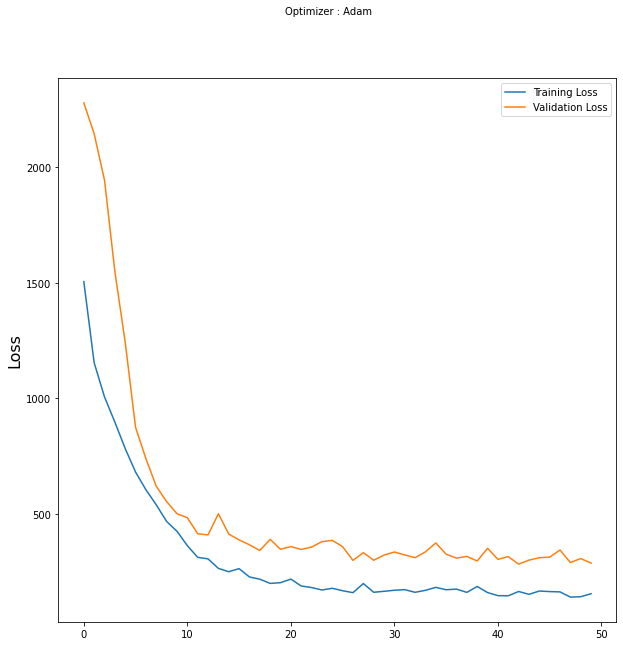

In [ ]:
# plot the evolution of Loss on the train and validation sets
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
plt.suptitle('Optimizer : Adam', fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(deeper_models_histories["deeper_model_with_larger_rf"].history['loss'], label='Training Loss')
plt.plot(deeper_models_histories["deeper_model_with_larger_rf"].history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.show()

In [ ]:
def deeper_model_with_largest_rf(learning_rate = 0.0001, reg_bool = False, reg_lambda = 0.0, dropout=0.0, activation = 'relu'):
  # create model
  model = Sequential()


  # add convolutional layer #1
  model.add(Conv2D(32, (3,3), input_shape=(144, 192, 3), padding='same', kernel_regularizer=regularizers.l2(reg_lambda), activation = activation))
  model.add(BatchNormalization())
  #model.add(MaxPooling2D())

  # Conv Layer #2
  model = model_block(model, 32, max_pool=True, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda, activation = activation )

  # Conv Layer #3
  model = model_block(model, 64, max_pool=False, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda, activation = activation )

  # Conv Layer #4
  model = model_block(model, 64, max_pool=True, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda, activation = activation)

  # Conv Layer #4
  model = model_block(model, 128, max_pool=False, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda, activation = activation )

  # Conv Layer #5
  model = model_block(model, 128, max_pool=True, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda, activation = activation )

  # Conv Layer #6
  model = model_block(model, 256, max_pool=False, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda, activation = activation )

  # Conv Layer #7
  model = model_block(model, 256, max_pool=True, batch_norm=True, reg=reg_bool, reg_lambda = reg_lambda, activation = activation )


  # Flatten for FC layers
  model.add(Flatten())
  model.add(Dropout(dropout))


  # Fully Connected Layers.
  model.add(Dense(512, activation=activation, kernel_regularizer=regularizers.l2(reg_lambda)))
  model.add(BatchNormalization())
  model.add(Dropout(dropout))

  model.add(Dense(256, activation=activation, kernel_regularizer=regularizers.l2(reg_lambda)))
  model.add(BatchNormalization())
  model.add(Dropout(dropout))
 

  
  # Multiple outputs to predict both Tilt/Pan values.
  model.add(Dense(2))


  opt = Adam(lr=learning_rate)
  model.compile(loss = 'mean_squared_error',  optimizer = opt)

  return model
print(deeper_model_with_largest_rf().summary())

Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_54 (Conv2D)           (None, 144, 192, 32)      896       
_________________________________________________________________
batch_normalization_48 (Batc (None, 144, 192, 32)      128       
_________________________________________________________________
conv2d_55 (Conv2D)           (None, 144, 192, 32)      9248      
_________________________________________________________________
batch_normalization_49 (Batc (None, 144, 192, 32)      128       
_________________________________________________________________
max_pooling2d_29 (MaxPooling (None, 72, 96, 32)        0         
_________________________________________________________________
conv2d_56 (Conv2D)           (None, 72, 96, 64)        18496     
___________________________________

In [ ]:
# Initilize deeper model with a smaller receptive field
model_largest_rf = deeper_model_with_largest_rf()

Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False


In [ ]:
# fit model
deeper_models_histories["deeper_model_with_largest_rf"]  = model_largest_rf.fit(trainX, trainY, epochs=50, batch_size=16, verbose=1, callbacks=get_callbacks_base("models/deeper_model_with_largest_rf"), validation_split=0.25)

Epoch 1/50
109/109 [==============================] - 3s 26ms/step - loss: 1514.1254 - val_loss: 2300.9995
Epoch 2/50
109/109 [==============================] - 2s 22ms/step - loss: 1152.6759 - val_loss: 2226.8213
Epoch 3/50
109/109 [==============================] - 2s 22ms/step - loss: 994.0640 - val_loss: 2031.1827
Epoch 4/50
109/109 [==============================] - 2s 22ms/step - loss: 881.1716 - val_loss: 1627.0725
Epoch 5/50
109/109 [==============================] - 2s 22ms/step - loss: 766.9783 - val_loss: 1114.5059
Epoch 6/50
109/109 [==============================] - 2s 22ms/step - loss: 691.8033 - val_loss: 782.5990
Epoch 7/50
109/109 [==============================] - 2s 22ms/step - loss: 595.9161 - val_loss: 620.8136
Epoch 8/50
109/109 [==============================] - 2s 22ms/step - loss: 536.2114 - val_loss: 532.3553
Epoch 9/50
109/109 [==============================] - 2s 22ms/step - loss: 472.2478 - val_loss: 513.6350
Epoch 10/50
109/109 [===========================

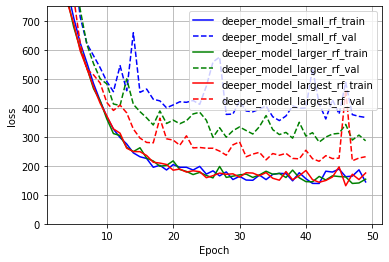

In [ ]:
compare_rf_models_histories = {}

compare_rf_models_histories['deeper_model_small_rf'] = deeper_models_histories['deeper_model_with_two_fc']
compare_rf_models_histories['deeper_model_larger_rf'] = deeper_models_histories['deeper_model_with_larger_rf']
compare_rf_models_histories['deeper_model_largest_rf'] = deeper_models_histories['deeper_model_with_largest_rf']



plotter(compare_rf_models_histories, ylim=[0,750], metric='loss')

## Hyperparameter searching with Grid Search

Below are a list of parameters that will be searched using the Grid Search:



*   Learning Rate (Alpha)
*   Batch Size
*   L2 Regularization (Lambda)
*   Percentage of Dropout



### Grid Search: Learning Rate (Part 1)

In [ ]:
learning_rates = [ 0.01, 0.001, 0.0001, 0.00001]

diff_learning_rate_histories = {}
search_models = {}

index = 0
# Train model in different batch sizes:
for learning_rate in learning_rates:


  # Re-initialize model every iteration:
  search_models[index] = deeper_model_with_largest_rf(learning_rate= learning_rate)

  # Check Model
  print(search_models[index].summary())
  
  diff_learning_rate_histories["model_learning_rate_"+str(learning_rate)] = search_models[index].fit(trainX, trainY, epochs=50, batch_size=16, verbose=1,callbacks=get_callbacks_base("models/deeper_model_with_lr_"+str(learning_rate)), validation_split=0.25)

  index += 1

Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_70 (Conv2D)           (None, 144, 192, 32)      896       
_________________________________________________________________
batch_normalization_68 (Batc (None, 144, 192, 32)      128       
_________________________________________________________________
conv2d_71 (Conv2D)           (None, 144, 192, 32)      9248      
_________________________________________________________________
batch_normalization_69 (Batc (None, 144, 192, 32)      128       
_________________________________________________________________
max_pooling2d_37 (MaxPooling (None, 72, 96, 32)        0         
_________________________________________________________________
conv2d_72 (Conv2D)           (None, 72, 96, 64)        18496     
___________________________________

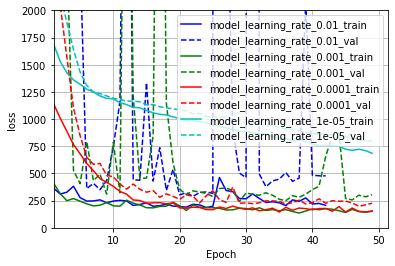

In [ ]:
# Compare Learning Curves
plotter(diff_learning_rate_histories, ylim=[0, 2000], metric='loss')

### Grid Search: Learning Rate (Part 2)

In [ ]:
learning_rates = [ 0.0001, 0.000075, 0.00006, 0.00001]

diff_learning_rate_histories = {}
search_models = {}

index = 0
# Train model in different batch sizes:
for learning_rate in learning_rates:


  # Re-initialize model every iteration:
  search_models[index] = deeper_model_with_largest_rf(learning_rate= learning_rate)

  # Check Model
  print(search_models[index].summary())
  diff_learning_rate_histories["model_learning_rate_"+str(learning_rate)] = search_models[index].fit(trainX, trainY, epochs=50, batch_size=16, verbose=1, callbacks=get_callbacks_base("models/deeper_model_with_lr_"+str(learning_rate)), validation_split=0.25)

  index += 1

Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_102 (Conv2D)          (None, 144, 192, 32)      896       
_________________________________________________________________
batch_normalization_108 (Bat (None, 144, 192, 32)      128       
_________________________________________________________________
conv2d_103 (Conv2D)          (None, 144, 192, 32)      9248      
_________________________________________________________________
batch_normalization_109 (Bat (None, 144, 192, 32)      128       
_________________________________________________________________
max_pooling2d_53 (MaxPooling (None, 72, 96, 32)        0         
_________________________________________________________________
conv2d_104 (Conv2D)          (None, 72, 96, 64)        18496     
___________________________________

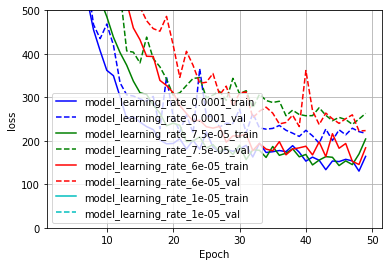

In [ ]:
# Compare Learning Curves
plotter(diff_learning_rate_histories, ylim=[0, 500], metric='loss')

###Grid Search: Batch Size

In [ ]:
batch_sizes = [8,16,32,64]

diff_batch_sizes_histories = {}

best_learning_rate = 0.00006

# Train model in different batch sizes:
for batch in batch_sizes:

  # Re-initialize model every iteration:
  search_model = deeper_model_with_largest_rf(learning_rate=best_learning_rate)
  diff_batch_sizes_histories["model_batch_size_"+str(batch)] = search_model.fit(trainX, trainY, epochs=80, batch_size=batch, verbose=1, callbacks=get_callbacks_base("models/deeper_model_with_batch_"+str(batch)), validation_split=0.25)



Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Reg:  False
Epoch 1/80
218/218 [==============================] - 4s 17ms/step - loss: 1585.3704 - val_loss: 2265.0457
Epoch 2/80
218/218 [==============================] - 3s 15ms/step - loss: 1211.7968 - val_loss: 1845.0535
Epoch 3/80
218/218 [==============================] - 3s 15ms/step - loss: 1068.7675 - val_loss: 1117.1749
Epoch 4/80
218/218 [==============================] - 3s 15ms/step - loss: 948.0435 - val_loss: 842.0087
Epoch 5/80
218/218 [==============================] - 3s 15ms/step - loss: 865.4061 - val_loss: 751.4740
Epoch 6/80
218/218 [==============================] - 3s 15ms/step - loss: 755.8277 - val_loss: 651.8633
Epoch 7/80
218/218 [==============================] - 3s 15ms/step - loss: 691.6390 - val_loss: 569.4305
Epoch 8/80
218/218 [==============================] - 3s 15ms/step - loss: 635.9421 - val_loss: 508.7086
Epoch 9/80
218/218 [==============================] - 3s 15ms/step - l

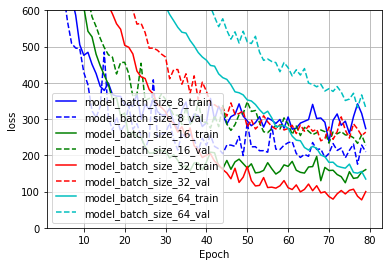

In [ ]:
# Compare Learning Curves
plotter(diff_batch_sizes_histories, ylim=[0,600], metric='loss')

### Grid Search: L2 Regularization (Part 1)

In [ ]:
reg_lambda_vals = [0.1, 0.01, 0.001, 0.0001, 0.0]

best_batch_size = 16

# Best Learning Rate as searched from above:
best_learning_rate = 0.00006

diff_reg_lambda_histories = {}

for reg_lambda_val in reg_lambda_vals:
  # Re-initialize model every iteration with different reg_lambda value:
  search_model = deeper_model_with_largest_rf(reg_lambda=reg_lambda_val, reg_bool=True, learning_rate=best_learning_rate)

  # Use best batch_size from previous search to train/search:
  diff_reg_lambda_histories["model_reg_lambda_"+str(reg_lambda_val)] = search_model.fit(trainX, trainY, epochs=50, batch_size=best_batch_size, verbose=1, callbacks=get_callbacks_base("models/deeper_model_with_reg_"+str(reg_lambda_val)), validation_split=0.25)



Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True
Epoch 1/50
109/109 [==============================] - 3s 27ms/step - loss: 1836.2749 - val_loss: 2516.3477
Epoch 2/50
109/109 [==============================] - 2s 22ms/step - loss: 1452.6183 - val_loss: 2496.5510
Epoch 3/50
109/109 [==============================] - 2s 23ms/step - loss: 1323.3785 - val_loss: 2333.5762
Epoch 4/50
109/109 [==============================] - 2s 22ms/step - loss: 1238.6318 - val_loss: 2051.8801
Epoch 5/50
109/109 [==============================] - 2s 22ms/step - loss: 1169.0864 - val_loss: 1684.2772
Epoch 6/50
109/109 [==============================] - 2s 22ms/step - loss: 1090.1505 - val_loss: 1274.1296
Epoch 7/50
109/109 [==============================] - 2s 22ms/step - loss: 1021.1258 - val_loss: 1142.0433
Epoch 8/50
109/109 [==============================] - 2s 23ms/step - loss: 960.9476 - val_loss: 1012.3528
Epoch 9/50
109/109 [==============================] - 2s 22ms/step -

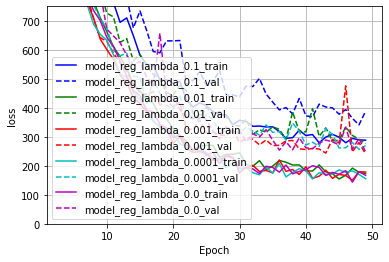

In [ ]:
# Compare Learning Curves
plotter(diff_reg_lambda_histories, ylim=[0, 750], metric='loss')

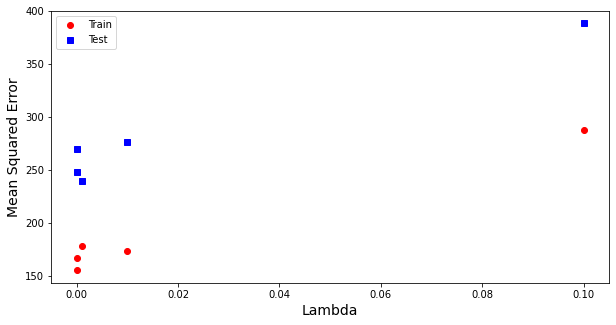

In [ ]:
plotter_search(diff_reg_lambda_histories, reg_lambda_vals, "model_reg_lambda_" )

### Grid Search: L2 Regularization (Part 2)



In [ ]:
reg_lambda_vals = [ 0.001, 0.002, 0.004, 0.008]

best_batch_size = 16
best_learning_rate = 0.00006
diff_reg_lambda_histories = {}

for reg_lambda_val in reg_lambda_vals:
  # Re-initialize model every iteration with different reg_lambda value:
  search_model = deeper_model_with_largest_rf(reg_lambda=reg_lambda_val, learning_rate = best_learning_rate, reg_bool=True)

  # Use best batch_size from previous search to train/search:
  diff_reg_lambda_histories["model_reg_lambda_"+str(reg_lambda_val)] = search_model.fit(trainX, trainY, epochs=50, batch_size=best_batch_size, verbose=1, validation_split=0.25)



Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True
Epoch 1/50
109/109 [==============================] - 3s 25ms/step - loss: 1644.4019 - val_loss: 2309.4792
Epoch 2/50
109/109 [==============================] - 2s 22ms/step - loss: 1251.3926 - val_loss: 2297.5872
Epoch 3/50
109/109 [==============================] - 2s 22ms/step - loss: 1139.9187 - val_loss: 2140.1245
Epoch 4/50
109/109 [==============================] - 2s 22ms/step - loss: 1034.5359 - val_loss: 1848.9298
Epoch 5/50
109/109 [==============================] - 2s 22ms/step - loss: 956.1751 - val_loss: 1392.5135
Epoch 6/50
109/109 [==============================] - 2s 22ms/step - loss: 890.4210 - val_loss: 1071.6201
Epoch 7/50
109/109 [==============================] - 2s 22ms/step - loss: 822.3150 - val_loss: 902.3326
Epoch 8/50
109/109 [==============================] - 2s 22ms/step - loss: 753.6650 - val_loss: 787.7307
Epoch 9/50
109/109 [==============================] - 2s 22ms/step - loss

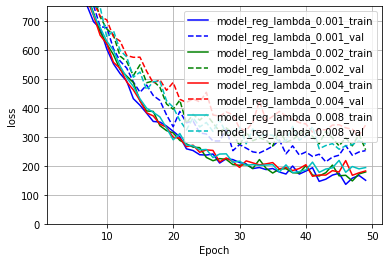

In [ ]:
# Compare Learning Curves
plotter(diff_reg_lambda_histories, ylim=[0, 750], metric='loss')

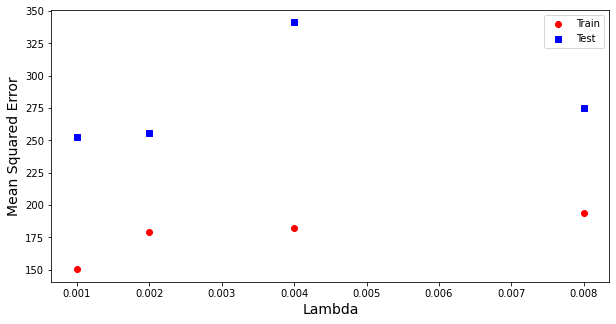

In [ ]:
plotter_search(diff_reg_lambda_histories, reg_lambda_vals, "model_reg_lambda_" )

### Grid Search: Dropout


In [ ]:
# dropout_percentages = [0.05, 0.1, 0.25, 0.5]

dropout_percentages = [.15, .3, .4, .45]

best_batch_size = 16

# Best Learning Rate as searched from above:
best_learning_rate = 0.00006

best_reg_lambda_val = 0.002

diff_dropout_histories = {}

for dropout_val in dropout_percentages:
  # Re-initialize model every iteration with different dropout value:
  search_model = deeper_model_with_largest_rf(reg_lambda=best_reg_lambda_val, reg_bool=True, learning_rate=best_learning_rate, dropout = dropout_val)

  # Use best hyperparameters from previous search to train/search:
  diff_dropout_histories["model_dropout_"+str(dropout_val)] = search_model.fit(trainX, trainY, epochs=50, batch_size=best_batch_size, verbose=1, callbacks=get_callbacks_base("models/deeper_model_with_dropout_"+str(dropout_val)), validation_split=0.25)



Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True
Epoch 1/50
109/109 [==============================] - 3s 27ms/step - loss: 1761.6862 - val_loss: 2308.0010
Epoch 2/50
109/109 [==============================] - 2s 22ms/step - loss: 1328.9987 - val_loss: 2278.4895
Epoch 3/50
109/109 [==============================] - 2s 22ms/step - loss: 1182.3698 - val_loss: 2105.5198
Epoch 4/50
109/109 [==============================] - 2s 22ms/step - loss: 1090.9015 - val_loss: 1741.5706
Epoch 5/50
109/109 [==============================] - 2s 22ms/step - loss: 1021.7286 - val_loss: 1382.8186
Epoch 6/50
109/109 [==============================] - 2s 22ms/step - loss: 959.7081 - val_loss: 1114.3627
Epoch 7/50
109/109 [==============================] - 2s 22ms/step - loss: 886.2385 - val_loss: 961.5305
Epoch 8/50
109/109 [==============================] - 2s 22ms/step - loss: 833.6743 - val_loss: 827.2603
Epoch 9/50
109/109 [==============================] - 2s 22ms/step - los

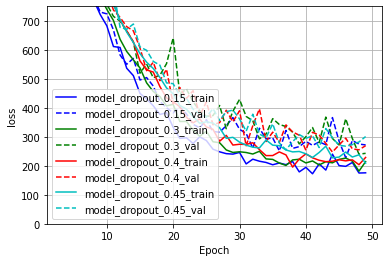

In [ ]:
# Compare Learning Curves
plotter(diff_dropout_histories, ylim=[0, 750], metric='loss')

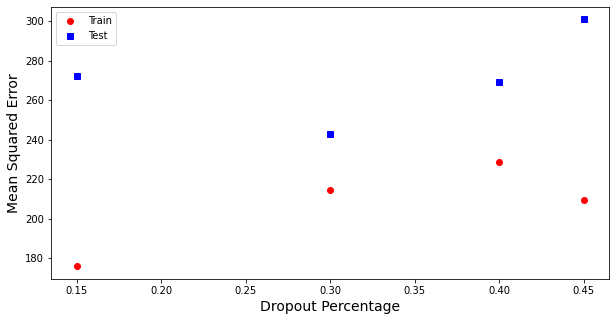

In [ ]:
plotter_search(diff_dropout_histories, dropout_percentages, "model_dropout_", label="Dropout Percentage" )

## Model: RESNET Infrastructure

Next, will be attempting to train our dataset on a res net infrastructure model. The goal is to create deeper models to observe if a more accurate model can be achieved. The performance of the residual network will then be compared to the 'plain' network built in the notebook above.

RESNET Code base reference: https://towardsdatascience.com/building-a-resnet-in-keras-e8f1322a49ba

In [ ]:
from tensorflow import Tensor
from tensorflow.keras.layers import Input, Conv2D, ReLU, BatchNormalization,\
                                    Add, AveragePooling2D, Flatten, Dense
from tensorflow.keras.models import Model

def relu_bn(inputs: Tensor) -> Tensor:
    relu = ReLU()(inputs)
    bn = BatchNormalization()(relu)
    return bn

def residual_block(x: Tensor, downsample: bool, filters: int, kernel_size: int = 3, reg_lambda: float = 0.001) -> Tensor:
    y = Conv2D(kernel_size=kernel_size,
               strides= (1 if not downsample else 2),
               filters=filters,
               padding="same",
               kernel_regularizer=tf.keras.regularizers.l2(reg_lambda))(x)
    y = relu_bn(y)
    y = Conv2D(kernel_size=kernel_size,
               strides=1,
               filters=filters,
               padding="same",
               kernel_regularizer=tf.keras.regularizers.l2(reg_lambda))(y)

    if downsample:
        x = Conv2D(kernel_size=1,
                   strides=2,
                   filters=filters,
                   padding="same",
                   kernel_regularizer=tf.keras.regularizers.l2(reg_lambda))(x)
    out = Add()([x, y])
    out = relu_bn(out)
    return out


In [ ]:
def res_net(reg_lambda=0.001, block_list = [3,3,3], learning_rate = 0.001):
    
    inputs = Input(shape=(144, 192, 3))
    num_filters = 64
    
    t = BatchNormalization()(inputs)
    t = Conv2D(kernel_size=3,
               strides=1,
               filters=num_filters,
               padding="same",
               kernel_regularizer=tf.keras.regularizers.l2(reg_lambda))(t)
    t = relu_bn(t)
    
    num_blocks_list = block_list
    for i in range(len(num_blocks_list)):
        num_blocks = num_blocks_list[i]
        for j in range(num_blocks):
            t = residual_block(t, downsample=(j==0 and i!=0), filters=num_filters, reg_lambda = reg_lambda)
        num_filters *= 2
    
    t = AveragePooling2D(4)(t)
    t = Flatten()(t)
    outputs = Dense(2)(t)
    
    model = Model(inputs, outputs)

    opt = Adam(lr=learning_rate)
    model.compile(
        optimizer=opt,
        loss='mean_squared_error'
    )

    return model


print(res_net().summary())

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 144, 192, 3) 0                                            
__________________________________________________________________________________________________
batch_normalization_130 (BatchN (None, 144, 192, 3)  12          input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_168 (Conv2D)             (None, 144, 192, 64) 1792        batch_normalization_130[0][0]    
__________________________________________________________________________________________________
re_lu (ReLU)                    (None, 144, 192, 64) 0           conv2d_168[0][0]                 
_______________________________________________________________________________________

In [ ]:
# Initilize deeper model with two fully connected layers
res_net_model = res_net()

In [ ]:
# fit model
deeper_models_histories["res_net"]  = res_net_model.fit(trainX, trainY, epochs=50, batch_size=16, verbose=1, callbacks=get_callbacks_base("models/res_net"), validation_split=0.2)

Epoch 1/50
117/117 [==============================] - 16s 138ms/step - loss: 590.2195 - val_loss: 3729918.2500
Epoch 2/50
117/117 [==============================] - 15s 128ms/step - loss: 236.6100 - val_loss: 14277.7207
Epoch 3/50
117/117 [==============================] - 15s 128ms/step - loss: 171.9933 - val_loss: 1566.1013
Epoch 4/50
117/117 [==============================] - 15s 128ms/step - loss: 164.7816 - val_loss: 773.1641
Epoch 5/50
117/117 [==============================] - 15s 128ms/step - loss: 137.1999 - val_loss: 609.6494
Epoch 6/50
117/117 [==============================] - 15s 128ms/step - loss: 121.6745 - val_loss: 1210.6313
Epoch 7/50
117/117 [==============================] - 15s 128ms/step - loss: 118.5615 - val_loss: 368.3877
Epoch 8/50
117/117 [==============================] - 15s 128ms/step - loss: 104.6449 - val_loss: 306.8731
Epoch 9/50
117/117 [==============================] - 15s 128ms/step - loss: 113.9000 - val_loss: 1215.4976
Epoch 10/50
117/117 [=======

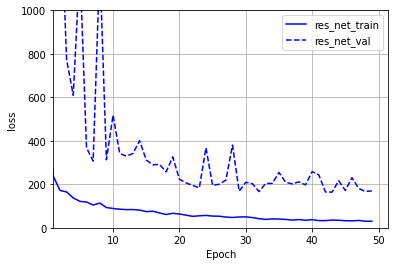

In [ ]:
res_net_histories = {}

res_net_histories["res_net"] = deeper_models_histories["res_net"]

plotter(res_net_histories, ylim=[0, 1000], metric='loss')

### RESNET Depth Comparison

In [ ]:
resnet_blocks_histories = {}
search_models = {}

best_batch_size = 8
reg_lambda_val = 0.0001
# block_list_vals = [[3,3], [3,3,3], [3,3,3,3], [3,4,4,4,3]]

# block_list_vals = [[2,2,2,2],[3,3,3,3], [4,4,4,4]]

# block_list_vals = [ [2,2,2,2,2], [2,3,3,3,3,2]]

# block_list_vals = [ [2,3,3,4,4, 3]]
index = 0

# Train model in different block_sizes
for block_val in block_list_vals:
  
  # Re-initialize model every iteration:
  search_models[index] = res_net(reg_lambda = reg_lambda_val, block_list = block_val) 

  resnet_blocks_histories["resnet_model_with_block_"+str(block_val)] = search_models[index].fit(trainX, trainY, epochs=50, batch_size=best_batch_size, verbose=1, callbacks=get_callbacks_base("models/deeper_model_with_block_"+str(block_val)), validation_split=0.3)

  # Increment model index
  index+=1

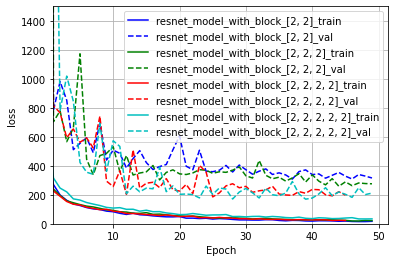

In [ ]:
# Compare Learning Curves
plotter(resnet_blocks_histories, ylim=[0, 1500], metric='loss')

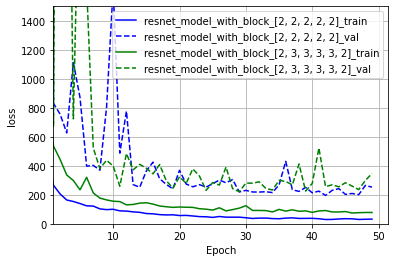

In [ ]:
# Compare Learning Curves
plotter(resnet_blocks_histories, ylim=[0, 1500], metric='loss')

In [ ]:
# Compare Learning Curves
plotter(resnet_blocks_histories, ylim=[0, 1500], metric='loss')

### Grid Search (RESNET): Learning Rate

In [ ]:
resnet_grid_histories = []
search_models = {}

best_batch_size = 16
reg_lambda_val = 0.0001
block_list_vals = [[3,3], [3,3,3], [3,3,3,3], [4,4,4,4]]
learning_rate_vals = [0.01, 0.001, 0.0001]
index = 0


for i in block_list_vals:
  resnet_grid_histories.append({})

list_index = 0
# Train model in different block_sizes and learning rates:
for block_val in block_list_vals:
  for learning_rate_val in learning_rate_vals:
    
    # Re-initialize model every iteration:
    search_models[index] = res_net(reg_lambda = reg_lambda_val, block_list = block_val, learning_rate = learning_rate_val) 

    resnet_grid_histories[list_index]["resnet_model_with_"+str(block_val)+"_"+str(learning_rate_val)] = search_models[index].fit(trainX, trainY, epochs=50, batch_size=best_batch_size, verbose=1, callbacks=get_callbacks_base("models/deeper_model_with_block_"+str(block_val)), validation_split=0.3)

    # Increment model index
    index+=1

  list_index+=1

Epoch 1/50
102/102 [==============================] - 12s 113ms/step - loss: 2017.6329 - val_loss: 857614.6875
Epoch 2/50
102/102 [==============================] - 11s 105ms/step - loss: 688.6010 - val_loss: 2809.0442
Epoch 3/50
102/102 [==============================] - 11s 106ms/step - loss: 297.7119 - val_loss: 684.8186
Epoch 4/50
102/102 [==============================] - 11s 106ms/step - loss: 183.9601 - val_loss: 482.4169
Epoch 5/50
102/102 [==============================] - 11s 106ms/step - loss: 173.5003 - val_loss: 395.5536
Epoch 6/50
102/102 [==============================] - 11s 106ms/step - loss: 144.3588 - val_loss: 525.2738
Epoch 7/50
102/102 [==============================] - 11s 106ms/step - loss: 127.4321 - val_loss: 490.1689
Epoch 8/50
102/102 [==============================] - 11s 106ms/step - loss: 112.8913 - val_loss: 432.7487
Epoch 9/50
102/102 [==============================] - 11s 106ms/step - loss: 99.9766 - val_loss: 498.0199
Epoch 10/50
102/102 [============

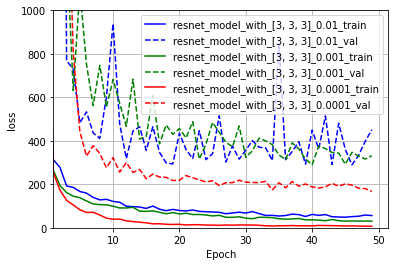

In [ ]:
plotter(resnet_grid_histories[1], ylim=[0, 1000], metric='loss')

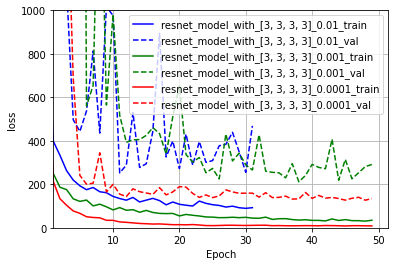

In [ ]:
plotter(resnet_grid_histories[2], ylim=[0, 1000], metric='loss')

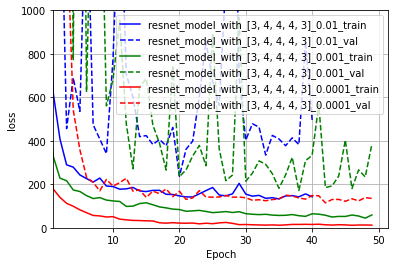

In [ ]:
plotter(resnet_grid_histories[3], ylim=[0, 1000], metric='loss')

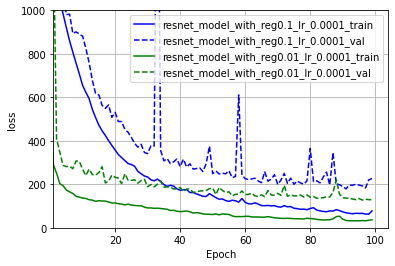

In [ ]:
plotter(resnet_grid_histories[0], ylim=[0, 1000], metric='loss')

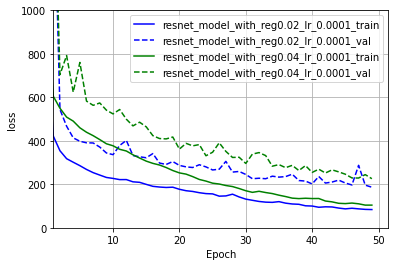

In [ ]:

plotter(resnet_grid_histories[0], ylim=[0, 1000], metric='loss')


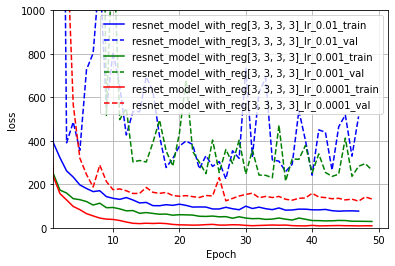

In [ ]:
plotter(resnet_grid_histories[3], ylim=[0, 1000], metric='loss')

## Final Model

### Final Model with 'relu' activation

In [ ]:
# Best Hyperparameters from grid search:
best_batch_size = 16

best_learning_rate = 0.00006

best_reg_lambda_val = 0.002

best_dropout = 0.15

# Initialize final model:
final_model = deeper_model_with_largest_rf(reg_lambda=best_reg_lambda_val, reg_bool=True, learning_rate=best_learning_rate, dropout = best_dropout)


Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True


In [ ]:
final_model.summary()

Model: "sequential_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_310 (Conv2D)          (None, 144, 192, 32)      896       
_________________________________________________________________
batch_normalization_368 (Bat (None, 144, 192, 32)      128       
_________________________________________________________________
conv2d_311 (Conv2D)          (None, 144, 192, 32)      9248      
_________________________________________________________________
batch_normalization_369 (Bat (None, 144, 192, 32)      128       
_________________________________________________________________
max_pooling2d_157 (MaxPoolin (None, 72, 96, 32)        0         
_________________________________________________________________
conv2d_312 (Conv2D)          (None, 72, 96, 64)        18496     
_________________________________________________________________
batch_normalization_370 (Bat (None, 72, 96, 64)      

In [ ]:
# Train Final Model
final_model_history = final_model.fit(trainX, trainY, epochs=200, batch_size=best_batch_size, verbose=1, callbacks=get_callbacks_base("models/final_model"), validation_split=0.25)

Epoch 1/200
109/109 [==============================] - 3s 27ms/step - loss: 1754.7073 - val_loss: 2303.6394
Epoch 2/200
109/109 [==============================] - 2s 22ms/step - loss: 1363.6711 - val_loss: 2258.0813
Epoch 3/200
109/109 [==============================] - 2s 22ms/step - loss: 1235.5752 - val_loss: 2099.0920
Epoch 4/200
109/109 [==============================] - 2s 22ms/step - loss: 1134.4940 - val_loss: 1776.9308
Epoch 5/200
109/109 [==============================] - 2s 22ms/step - loss: 1057.7031 - val_loss: 1377.6802
Epoch 6/200
109/109 [==============================] - 2s 22ms/step - loss: 984.5748 - val_loss: 1086.1127
Epoch 7/200
109/109 [==============================] - 2s 22ms/step - loss: 910.2646 - val_loss: 985.6805
Epoch 8/200
109/109 [==============================] - 2s 22ms/step - loss: 857.3327 - val_loss: 871.1818
Epoch 9/200
109/109 [==============================] - 2s 22ms/step - loss: 796.0316 - val_loss: 805.9989
Epoch 10/200
109/109 [=============

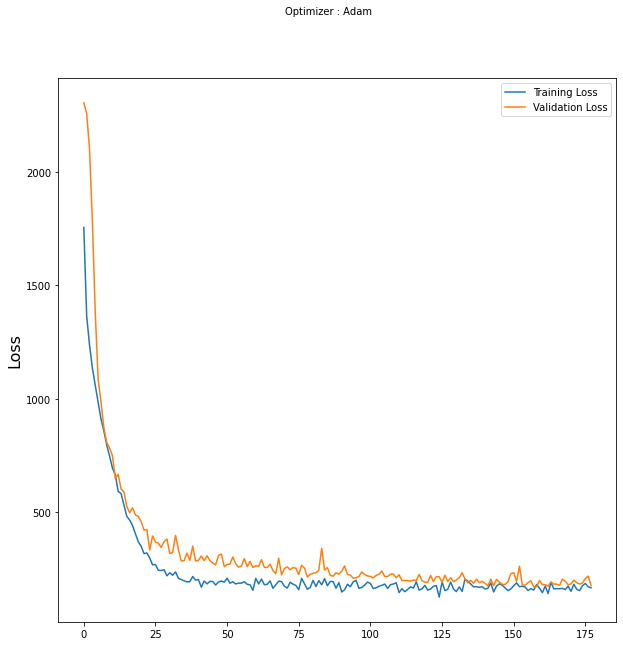

In [ ]:
# plot the evolution of Loss on the train and validation sets
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
plt.suptitle('Optimizer : Adam', fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(final_model_history.history['loss'], label='Training Loss')
plt.plot(final_model_history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.show()

### Final Model with 'elu' Activation

In [ ]:
# Intialize final model with 'elu' activation
final_model_with_elu = deeper_model_with_largest_rf(reg_lambda=best_reg_lambda_val, reg_bool=True, learning_rate=best_learning_rate, dropout = best_dropout, activation='elu')


Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True
Reg:  True


In [ ]:
final_model_with_elu_history = final_model_with_elu.fit(trainX, trainY, epochs=200, batch_size=best_batch_size, verbose=1, callbacks=get_callbacks_base("models/final_model_with_elu"), validation_split=0.25)

Epoch 1/200
109/109 [==============================] - 3s 28ms/step - loss: 1505.2837 - val_loss: 2212.1565
Epoch 2/200
109/109 [==============================] - 3s 24ms/step - loss: 1185.6383 - val_loss: 2097.6638
Epoch 3/200
109/109 [==============================] - 3s 24ms/step - loss: 1079.8740 - val_loss: 1843.4944
Epoch 4/200
109/109 [==============================] - 3s 24ms/step - loss: 1000.7083 - val_loss: 1505.3407
Epoch 5/200
109/109 [==============================] - 3s 24ms/step - loss: 931.1444 - val_loss: 1186.4841
Epoch 6/200
109/109 [==============================] - 3s 24ms/step - loss: 883.8398 - val_loss: 971.4637
Epoch 7/200
109/109 [==============================] - 3s 24ms/step - loss: 818.1528 - val_loss: 816.6218
Epoch 8/200
109/109 [==============================] - 3s 23ms/step - loss: 757.6074 - val_loss: 876.3087
Epoch 9/200
109/109 [==============================] - 3s 24ms/step - loss: 688.3983 - val_loss: 737.2854
Epoch 10/200
109/109 [===============

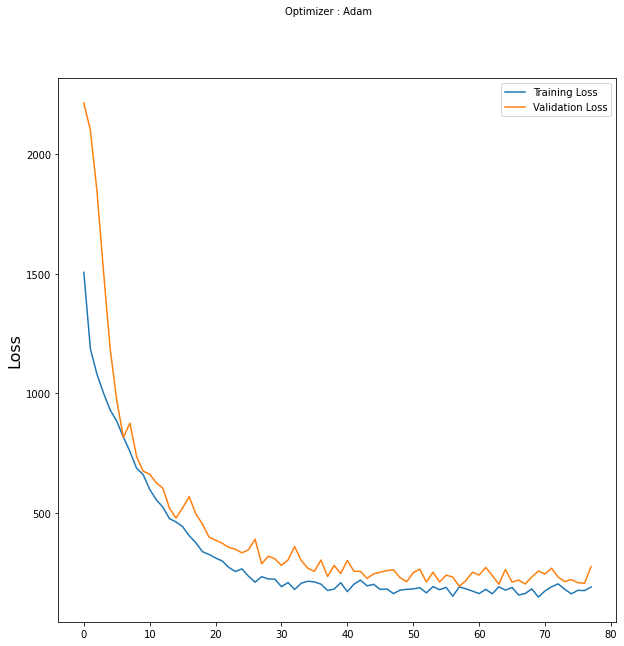

In [ ]:
# plot the evolution of Loss on the train and validation sets
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
plt.suptitle('Optimizer : Adam', fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(final_model_with_elu_history.history['loss'], label='Training Loss')
plt.plot(final_model_with_elu_history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.show()

### Relu vs Elu Activation Comparison

In [ ]:
compare_final_models_histories = {}

compare_final_models_histories['final_model_relu'] = final_model_history
compare_final_models_histories['final_model_elu'] = final_model_with_elu_history

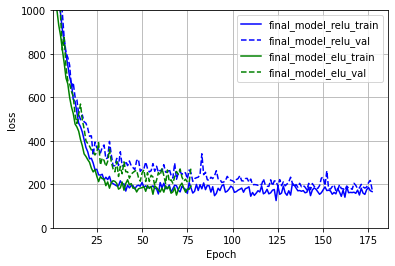

In [ ]:
# Compare Learning Curves
plotter(compare_final_models_histories, ylim=[0, 1000], metric='loss')

## Prediction on Test Dataset

In [ ]:
import csv
# Read CSV file
with open("s1234567_predictions.csv") as fp:
    reader = csv.reader(fp, delimiter=",", quotechar='"')

    csv_list = list(reader)
    index = 0
    for row in csv_list:
      print(row[0])

      if row[0] != 'filename':
        # image = Image.open('images/modified_data/train/'+row['filename'])
        pixels = cv2.imread('images/modified_data/'+row[0])

        # Convert from integers to floats
        pixels = pixels.astype('float32')

        # Normalize to the range 0-1
        pixels /= 255.0
 
        print(asarray([pixels]).shape)

        # Predict with final selected model 
        predicted = final_model.predict(asarray([pixels]))

        print(predicted)
        
        # Replace with predicted values.

        # Predicted Tilt Values.
        csv_list[index][1] = predicted[0][0]

        # Predicted Pan Values.
        csv_list[index][2] = predicted[0][1]
        
      index+=1

print(csv_list)


# Write predictions to csv file with student id.
file = open('s3806077_predictions.csv','w+', newline='')

with file:
  write = csv.writer(file)
  write.writerows(csv_list)


filename
face_33.jpg
(1, 144, 192, 3)
[[ 96.24641  -11.482488]]
face_2148.jpg
(1, 144, 192, 3)
[[57.046993  9.955153]]
face_2119.jpg
(1, 144, 192, 3)
[[-11.010105  22.158165]]
face_1262.jpg
(1, 144, 192, 3)
[[18.211426   1.3771431]]
face_516.jpg
(1, 144, 192, 3)
[[ 36.60139  -58.935825]]
face_1530.jpg
(1, 144, 192, 3)
[[ 27.106304 -26.299103]]
face_464.jpg
(1, 144, 192, 3)
[[45.536503 11.499861]]
face_1971.jpg
(1, 144, 192, 3)
[[ 32.172943 -64.74476 ]]
face_92.jpg
(1, 144, 192, 3)
[[42.926956 65.67038 ]]
face_921.jpg
(1, 144, 192, 3)
[[ 17.84915 -29.00809]]
face_2767.jpg
(1, 144, 192, 3)
[[ 38.052147 -42.233284]]
face_563.jpg
(1, 144, 192, 3)
[[45.82867 26.48918]]
face_1471.jpg
(1, 144, 192, 3)
[[16.355265 94.461105]]
face_1513.jpg
(1, 144, 192, 3)
[[ 32.123657 -33.757545]]
face_1585.jpg
(1, 144, 192, 3)
[[-37.561176  78.13708 ]]
face_1113.jpg
(1, 144, 192, 3)
[[   0.562684 -104.464676]]
face_2556.jpg
(1, 144, 192, 3)
[[25.090895 40.5358  ]]
face_2226.jpg
(1, 144, 192, 3)
[[ 51.163883 